# Introduction

The dataset includes Address, Type of Real estate, Suburb, Method of Selling, Rooms, Price, Real Estate Agent, Date of Sale and distance from C.B.D.

1. Suburb: The name of the suburb where the property is located.

2. Address: The specific address of the property.

3. Rooms: The number of rooms in the property (bedrooms, living rooms, etc.).

4. Price: The price of the property in Australian dollars.

5. Method: The method used for selling the property (e.g., auction, private sale).

6. Type: The type of property (house, unit, townhouse, etc.).

7. SellerG: The name of the real estate agent who sold the property.

8. Date: The date when the property was sold.

9. Distance: The distance of the property from the central business district (CBD) in kilometers.

10. Regionname: The general region of Melbourne where the property is located (e.g., West, North East).

11. Propertycount: The number of properties that exist in the same suburb.

12. Bedroom2: The number of bedrooms in the property (as scraped from a different source).

13. Bathroom: The number of bathrooms in the property.

14. Car: The number of parking spots available for cars.

15. 1Landsize: The size of the land associated with the property, measured in square meters.

16. BuildingArea: The size of the building or property's interior, measured in square meters.

17. YearBuilt: The year in which the property was built.

18. CouncilArea: The governing council for the area where the property is located.

19. Latitude: The latitude coordinate of the property's location.

20. Longitude: The longitude coordinate of the property's location.

<font color = "blue">

Content:

1. [Import Libraries](#1)
1. [Load and Check Data](#2)
1. [Basic Data Analysis](#3)
    * [Missing Value](#4)
    - [Check Missing Values in a Dataset](#5)
1. [Machine Learning Algorithms](#7)


<a id = "1"></a><br>
# Import Libraries

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import matplotlib.pyplot as plt
plt.style.use("seaborn-whitegrid")

import seaborn as sns  # visualization tool

from collections import Counter

import warnings
warnings.filterwarnings("ignore")

C:\Users\onur_\AppData\Local\Temp\ipykernel_8604\782975191.py:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-whitegrid")


<a id = "2"></a><br>
# Load and Check Data

In [2]:
data = pd.read_csv("Melbourne_housing_FULL.csv")
data.columns


Index(['Suburb', 'Address', 'Rooms', 'Type', 'Price', 'Method', 'SellerG',
       'Date', 'Distance', 'Postcode', 'Bedroom2', 'Bathroom', 'Car',
       'Landsize', 'BuildingArea', 'YearBuilt', 'CouncilArea', 'Lattitude',
       'Longtitude', 'Regionname', 'Propertycount'],
      dtype='object')

In [3]:
data.head(5)


,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,Abbotsford,68 Studley St,2,h,NaN,SS,Jellis,3/09/2016,2.5,3067.0,...,1.0,1.0,126.0,NaN,NaN,Yarra City Council,-37.8014,144.9958,Northern Metropolitan,4019.0
1,Abbotsford,85 Turner St,2,h,1480000.0,S,Biggin,3/12/2016,2.5,3067.0,...,1.0,1.0,202.0,NaN,NaN,Yarra City Council,-37.7996,144.9984,Northern Metropolitan,4019.0
2,Abbotsford,25 Bloomburg St,2,h,1035000.0,S,Biggin,4/02/2016,2.5,3067.0,...,1.0,0.0,156.0,79.0,1900.0,Yarra City Council,-37.8079,144.9934,Northern Metropolitan,4019.0
3,Abbotsford,18/659 Victoria St,3,u,NaN,VB,Rounds,4/02/2016,2.5,3067.0,...,2.0,1.0,0.0,NaN,NaN,Yarra City Council,-37.8114,145.0116,Northern Metropolitan,4019.0
4,Abbotsford,5 Charles St,3,h,1465000.0,SP,Biggin,4/03/2017,2.5,3067.0,...,2.0,0.0,134.0,150.0,1900.0,Yarra City Council,-37.8093,144.9944,Northern Metropolitan,4019.0


In [4]:
data.describe()

,Rooms,Price,Distance,Postcode,Bedroom2,Bathroom,Car,Landsize,BuildingArea,YearBuilt,Lattitude,Longtitude,Propertycount
count,34857.000000,2.724700e+04,34856.000000,34856.000000,26640.000000,26631.000000,26129.000000,23047.000000,13742.00000,15551.000000,26881.000000,26881.000000,34854.000000
mean,3.031012,1.050173e+06,11.184929,3116.062859,3.084647,1.624798,1.728845,593.598993,160.25640,1965.289885,-37.810634,145.001851,7572.888306
std,0.969933,6.414671e+05,6.788892,109.023903,0.980690,0.724212,1.010771,3398.841946,401.26706,37.328178,0.090279,0.120169,4428.090313
min,1.000000,8.500000e+04,0.000000,3000.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1196.000000,-38.190430,144.423790,83.000000
25%,2.000000,6.350000e+05,6.400000,3051.000000,2.000000,1.000000,1.000000,224.000000,102.00000,1940.000000,-37.862950,144.933500,4385.000000
50%,3.000000,8.700000e+05,10.300000,3103.000000,3.000000,2.000000,2.000000,521.000000,136.00000,1970.000000,-37.807600,145.007800,6763.000000
75%,4.000000,1.295000e+06,14.000000,3156.000000,4.000000,2.000000,2.000000,670.000000,188.00000,2000.000000,-37.754100,145.071900,10412.000000
max,16.000000,1.120000e+07,48.100000,3978.000000,30.000000,12.000000,26.000000,433014.000000,44515.00000,2106.000000,-37.390200,145.526350,21650.000000


<a id = "3"></a><br>
# Basic Data Analysis

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Suburb         34857 non-null  object 
 1   Address        34857 non-null  object 
 2   Rooms          34857 non-null  int64  
 3   Type           34857 non-null  object 
 4   Price          27247 non-null  float64
 5   Method         34857 non-null  object 
 6   SellerG        34857 non-null  object 
 7   Date           34857 non-null  object 
 8   Distance       34856 non-null  float64
 9   Postcode       34856 non-null  float64
 10  Bedroom2       26640 non-null  float64
 11  Bathroom       26631 non-null  float64
 12  Car            26129 non-null  float64
 13  Landsize       23047 non-null  float64
 14  BuildingArea   13742 non-null  float64
 15  YearBuilt      15551 non-null  float64
 16  CouncilArea    34854 non-null  object 
 17  Lattitude      26881 non-null  float64
 18  Longti

In [6]:
# changing variables categorically for better processing
data['Suburb'] = data['Suburb'].astype('category')
data['Address'] = data['Address'].astype('category')
data['Type'] = data['Type'].astype('category')
data['Method'] = data['Method'].astype('category')
data['SellerG'] = data['SellerG'].astype('category')
data['Date'] = data['Date'].astype('category')
data['CouncilArea'] = data['CouncilArea'].astype('category')
data['Regionname'] = data['Regionname'].astype('category')


In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34857 entries, 0 to 34856
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Suburb         34857 non-null  category
 1   Address        34857 non-null  category
 2   Rooms          34857 non-null  int64   
 3   Type           34857 non-null  category
 4   Price          27247 non-null  float64 
 5   Method         34857 non-null  category
 6   SellerG        34857 non-null  category
 7   Date           34857 non-null  category
 8   Distance       34856 non-null  float64 
 9   Postcode       34856 non-null  float64 
 10  Bedroom2       26640 non-null  float64 
 11  Bathroom       26631 non-null  float64 
 12  Car            26129 non-null  float64 
 13  Landsize       23047 non-null  float64 
 14  BuildingArea   13742 non-null  float64 
 15  YearBuilt      15551 non-null  float64 
 16  CouncilArea    34854 non-null  category
 17  Lattitude      26881 non-null  

In [8]:
print(f'Shape     : {data.shape}\n'
      f'Size      : {data.size}\n' 
      f'Dimension : {data.ndim}')

Shape     : (34857, 21)
Size      : 731997
Dimension : 2


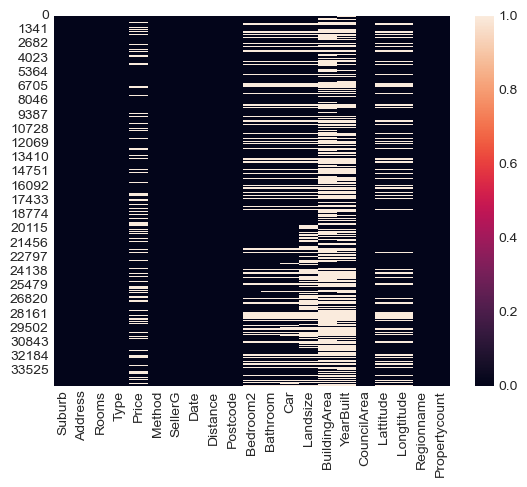

(34857, 21) 



In [9]:
# visualization to see missing values
sns.heatmap(data.isnull())
plt.show()

print(data.shape, "\n")

plt.show()

In [10]:
data.isnull().sum().sort_values(ascending=False)

BuildingArea     21115
YearBuilt        19306
Landsize         11810
Car               8728
Bathroom          8226
Bedroom2          8217
Longtitude        7976
Lattitude         7976
Price             7610
Regionname           3
CouncilArea          3
Propertycount        3
Postcode             1
Distance             1
Address              0
Date                 0
SellerG              0
Method               0
Type                 0
Rooms                0
Suburb               0
dtype: int64

In [11]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

In [12]:
# fill in missing values
for column in data.columns:
    data[column] = data[column].fillna(data[column].mode().iloc[0])
    data[column] = encoder.fit_transform(data[column])

In [13]:
data.isnull().sum().sort_values(ascending=False)

Suburb           0
Bathroom         0
Regionname       0
Longtitude       0
Lattitude        0
CouncilArea      0
YearBuilt        0
BuildingArea     0
Landsize         0
Car              0
Bedroom2         0
Address          0
Postcode         0
Distance         0
Date             0
SellerG          0
Method           0
Price            0
Type             0
Rooms            0
Propertycount    0
dtype: int64

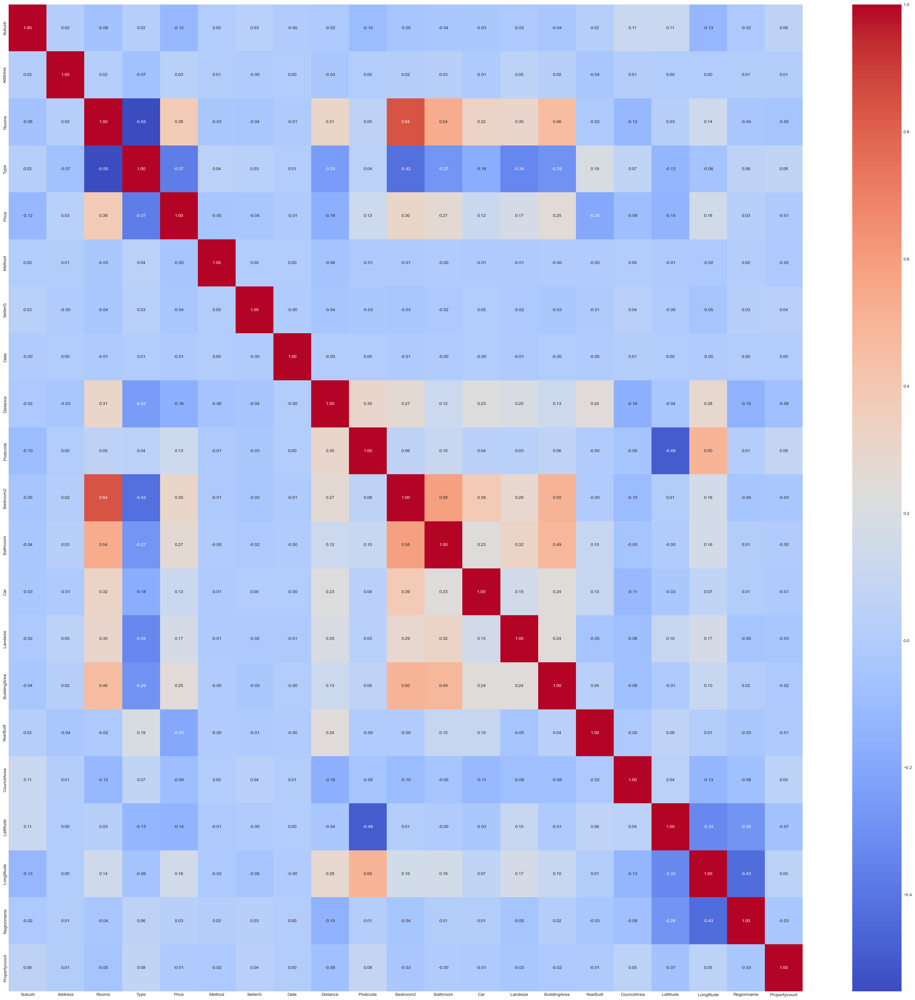

In [14]:
# correlation matrix to see the relationship of the data with each other
corr = data.corr()
plt.figure(figsize=(40, 40))
sns.heatmap(corr, xticklabels=corr.columns, yticklabels=corr.columns, annot=True, fmt=".2f", cmap='coolwarm')
plt.show()

In [15]:
df = data.dropna(subset=['Price'])

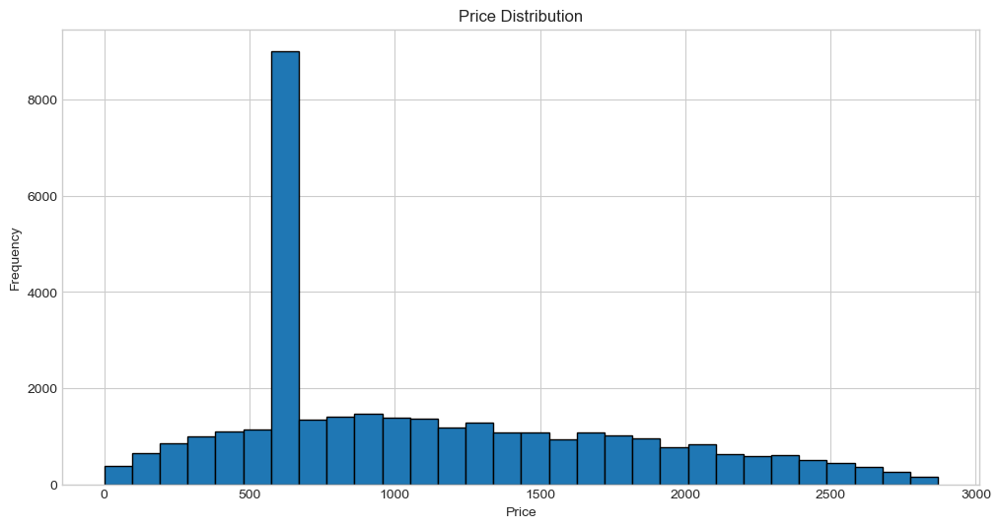

In [16]:
# histogram chart of price variable
plt.figure(figsize=(12,6))
plt.hist(df['Price'], bins=30, edgecolor='black')
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.show()

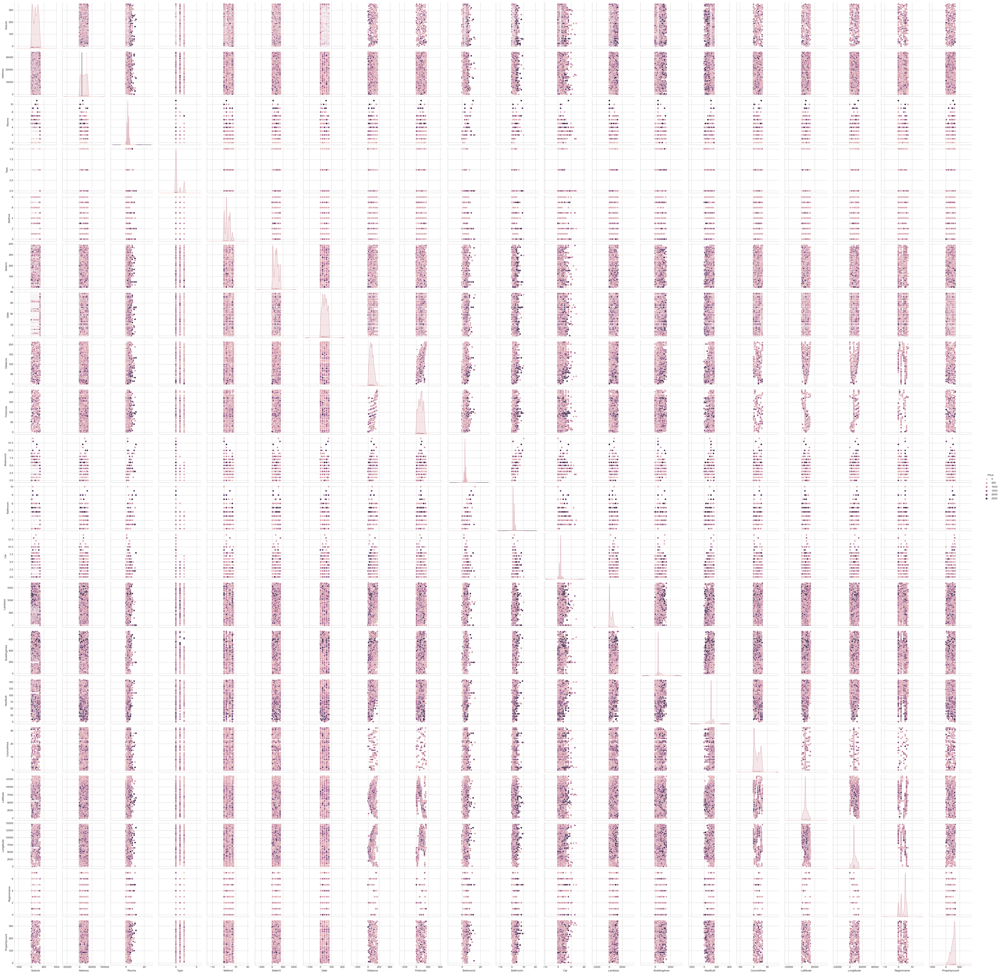

<Figure size 3000x3000 with 0 Axes>

In [17]:
# Create a pair plot
sns.pairplot(data, hue='Price')

# Set the plot size
plt.figure(figsize=(30,30))

# Set the plot style
sns.set(style="whitegrid")

# Show the plot
plt.show()

<a id = "7"></a><br>
# Machine Learning Algorithms

In [18]:
#Import Libraries
import numpy as np
import pandas as pd 
from sklearn.model_selection import train_test_split, GridSearchCV,cross_val_score
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt
from sklearn.preprocessing import scale 
from sklearn import model_selection
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.svm import LinearSVR
from sklearn.preprocessing import StandardScaler



from warnings import filterwarnings
filterwarnings('ignore')

from datetime import datetime

In [19]:
data.head()

,Suburb,Address,Rooms,Type,Price,Method,SellerG,Date,Distance,Postcode,...,Bathroom,Car,Landsize,BuildingArea,YearBuilt,CouncilArea,Lattitude,Longtitude,Regionname,Propertycount
0,0,29458,1,0,614,6,155,58,13,53,...,1,1,101,195,109,31,7082,6434,2,184
1,0,32512,1,0,1960,2,33,60,13,53,...,1,1,177,195,109,31,7155,6556,2,184
2,0,15389,1,0,1427,2,33,63,13,53,...,1,0,131,100,40,31,6781,6328,2,184
3,0,9768,2,2,614,7,296,63,13,53,...,2,1,0,195,109,31,6628,7185,2,184
4,0,25128,2,0,1945,5,33,64,13,53,...,2,0,109,259,40,31,6714,6372,2,184


In [20]:
#splitting data
y = data["Price"]
X = data.drop(['Price'], axis=1)
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.25, 
                                                    random_state=42)



In [21]:

# Import Models
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.ensemble import AdaBoostRegressor

from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from math import sqrt

In [22]:
models = {
'Lasso': {
'model': Lasso()
},
'LinearRegression': {
'model': LinearRegression()
},
'Ridge': {
'model': Ridge()
},
'ElasticNet': {
'model': ElasticNet()
},
'KNeighborsRegressor': {
'model': KNeighborsRegressor()
},
'RandomForestRegressor': {
'model': RandomForestRegressor()
},
'GradientBoostingRegressor': {
'model': GradientBoostingRegressor()
},
'AdaBoostRegressor': {
'model': AdaBoostRegressor(n_estimators = 5, learning_rate = 1.2, loss = 'exponential', random_state = 2)
}
}
print(models)

{'Lasso': {'model': Lasso()}, 'LinearRegression': {'model': LinearRegression()}, 'Ridge': {'model': Ridge()}, 'ElasticNet': {'model': ElasticNet()}, 'KNeighborsRegressor': {'model': KNeighborsRegressor()}, 'RandomForestRegressor': {'model': RandomForestRegressor()}, 'GradientBoostingRegressor': {'model': GradientBoostingRegressor()}, 'AdaBoostRegressor': {'model': AdaBoostRegressor(learning_rate=1.2, loss='exponential', n_estimators=5,
                  random_state=2)}}


In [23]:
#training models
for model_name, model_info in models.items():
    model = model_info['model']
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    # getting evaluation metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    print(f'{model_name} RMSE: {rmse}')
    print(f'{model_name} MAE: {mae}')
    print(f'{model_name} MSE: {mse}')
    print(f'{model_name} R2: {r2}')
    
    
    
   

Lasso RMSE: 522.0546886666756
Lasso MAE: 410.239556124277
Lasso MSE: 272541.0979588596
Lasso R2: 0.35037705777188555
LinearRegression RMSE: 522.0235390056988
LinearRegression MAE: 410.0130381563786
LinearRegression MSE: 272508.5752760343
LinearRegression R2: 0.3504545781204286
Ridge RMSE: 522.0236768861865
Ridge MAE: 410.01422282510913
Ridge MSE: 272508.7192297737
Ridge R2: 0.35045423499547457
ElasticNet RMSE: 532.4570237598061
ElasticNet MAE: 425.3559084324601
ElasticNet MSE: 283510.48215115076
ElasticNet R2: 0.32423067586179843
KNeighborsRegressor RMSE: 594.1790224421169
KNeighborsRegressor MAE: 461.9480436029834
KNeighborsRegressor MSE: 353048.71071026963
KNeighborsRegressor R2: 0.1584808899681316
RandomForestRegressor RMSE: 456.14341201201285
RandomForestRegressor MAE: 323.4505454388984
RandomForestRegressor MSE: 208066.8123219609
RandomForestRegressor R2: 0.5040565411495463
GradientBoostingRegressor RMSE: 465.5050271343817
GradientBoostingRegressor MAE: 351.04981741103273
Gradient